In [2]:
import numpy as np
import json
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle, Circle, Ellipse
from scipy import interpolate, ndimage, optimize
from pylab import cm

%matplotlib inline

In [3]:
def Load2DEELS_SI(fname):
    """
    Loads a 2D EEL Spectrum Image 
    
    Input:  fname - path to either .npy or .json file that (string)
    Output: dat   - data (numpy array)
            cal   - line scan calibration in nm (float)
            disp  - energy dispersion in eV (float)
            mdat  - metadata (python dictionary)
    """    

    if fname.endswith('npy'): fname=fname[:-4]
    if fname.endswith('json'): fname=fname[:-5]
    dat=np.load(fname+'.npy')
    mdat= json.load(open(fname+'.json','r'))
    cal=mdat['spatial_calibrations'][0]['scale']    
    disp=mdat['spatial_calibrations'][3]['scale']
    return dat,cal,disp,mdat

def Load2DEELS_Rec(fname):
    """
    Loads an EELS 2D Acquisition Recording
    
    Input:  fname - path to either .npy or .json file that (string)
    Output: dat   - data (numpy array)
            disp  - energy dispersion in eV (float)
            mdat  - metadata (python dictionary)
    """    

    if fname.endswith('npy'): fname=fname[:-4]
    if fname.endswith('json'): fname=fname[:-5]
    dat=np.load(fname+'.npy')
    mdat= json.load(open(fname+'.json','r'))
    disp=mdat['spatial_calibrations'][2]['scale']
    return dat,disp,mdat

def LoadImage(fname):
    """
    Loads a 2D STEM Image
    
    Input:  fname - path to either .npy or .json file that (string)
    Output: im    - image data (numpy array)
            cal   - pixel calibration in nm (float)
            mdat  - metadata (python dictionary)
    """    

    if fname.endswith('npy'): fname=fname[:-4]
    if fname.endswith('json'): fname=fname[:-5]
    dat=np.load(fname+'.npy')
    mdat= json.load(open(fname+'.json','r'))
    cal=mdat['spatial_calibrations'][0]['scale']
    return dat,cal,mdat

In [71]:
### Load files
filename='/Volumes/CarneAsada/PCBackup_2022_EOY/Data/Me/EdgePolaritons/Small_Submission_Final/Experiments/ExportedDatasets/SI-Corner64x64-2DSI.npy'
dat,cal,disp,mdat=Load2DEELS_SI(filename)

filename='/Volumes/CarneAsada/PCBackup_2022_EOY/Data/Me/EdgePolaritons/Small_Submission_Final/Experiments/ExportedDatasets/SI-Corner64x64-Z.npy'
datz,calz,mdatz=LoadImage(filename)

print(dat.shape,datz.shape)

(64, 64, 80, 2048) (64, 64)


In [59]:
#Helpful function for quickly adding a scale bar 

def AddScaleBar(axis,scale,cal,w=None,xy=None,units='nm',fontsize=8,text=True):
    """
    Adds scale bar to an image in a subplot
    Input:    axis     - subplot axis for added scalebar (matplotlib axis)
              scale    - desired length of scalebar in desired unit (int)
              cal      - calibration of image in desired units/pixel (float)
    Optional: w        - width of scale bar in pixels (float) Default: 1/50th of image height
              xy       - coordinates of top left corner of scale bar (tuple) NOTE: coordinates of bar not text
                          Default: None (puts bar w pixels in each dimension away from bottom left corner)
              units    - desired units (str) Default: 'nm'
              fontsize - size of font (float) Default: 8
              text     - Display actual text of scale bar (bool) Default: True
    Output: fig - displayed image (matplotlib figure)
    """   
    imdim=axis.get_images()[0].get_extent()
    dim=[int(imdim[2]-imdim[3]),int(imdim[1]-imdim[-0])]
    if not w: w=dim[0]/50.
    if not xy: xy=(w,dim[0]-2*w)
    axis.add_patch(Rectangle(xy,scale/cal,w,fc='w',ec='k',lw=0.5))
    if text: 
        txt=axis.text(xy[0]+0.5*scale/cal,xy[1],str(scale)+' '+units,fontweight='bold',color='w',fontsize=fontsize,ha='center',va='bottom')
        txt.set_path_effects([pe.withStroke(linewidth=1,foreground='k')])
    return

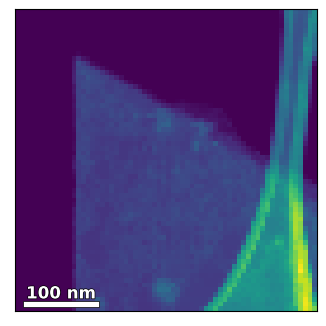

In [60]:
#Display HAADF Profile
f,a=plt.subplots(1,1,dpi=100)
plt.setp(a,xticks=[],yticks=[])
a.imshow(datz)
AddScaleBar(a,100,calz,fontsize=12)

In [61]:
#Basic functions for data analysis

def NormArray(arr):
    """
    Converts an array of arbitrary values to a 0-1 range
    
    Input:  arr  - numpy array
    Output: narr - normalized numpy array
    """    
    
    arr = np.asarray(arr)
    M=np.amax(arr);m=np.amin(arr)
    narr = (arr-m)/(M-m)
    return narr

def Get_i(arr,val):
    """
    Gives index of array closest to desired value
    
    Input:  arr - numpy array
            val - float
    Output: i   - index of closest value to desired float (int)
    """    
    
    i=np.argmin(np.abs(arr-val))
    return i

def Get_FWHM_i(spec):
    """
    Finds FWHM of ZLP and returns half-maxes, center, and width in channel indices
    
    Input:  spec  - EELS axis (numpy array)
    Output: i_lo - index of channel closest to lower half max (int)
            i_hi - index of channel closest to upper half max (int)
            i_c  - channel of zlp_center  
            i_w  - FWHM of ZLP in channels (float)
    """    
    
    s=NormArray(spec)
    i_lo=Get_i(s[:np.argmax(s)],0.5)
    i_hi=Get_i(s[np.argmax(s):],0.5)+np.argmax(s)
    
    i_c=np.mean([i_hi,i_lo])
    i_w=i_hi-i_lo
    return i_lo,i_hi,i_c,i_w

def Get_FWHM(en,spec,interp=False):
    """
    Finds FWHM of ZLP and returns half-maxes and width in energy
    
    Input:  en    - energy loss axis (numpy array)
            spec  - EELS axis (numpy array)
    Output: en_lo - energy of lower half max in eV (float)
            en_hi - energy of upper half max in eV (float)
            en_w  - FWHM of ZLP in eV (float)
    """    
    
    s=NormArray(spec)
    i_lo=Get_i(s[:np.argmax(s)],0.5)
    i_hi=Get_i(s[np.argmax(s):],0.5)+np.argmax(s)
    if interp:
        #disp=en[1]-en[0];disp_i=disp/100.
        #en_lo_fit=np.arange(en[i_lo-1:i_lo+1],disp_i);en_hi_fit=np.arange(en[i_hi-1:i_hi+1],disp_i)
        f_lo=interpolate.interp1d(s[i_lo-1:i_lo+2],en[i_lo-1:i_lo+2])
        f_hi=interpolate.interp1d(s[i_hi-1:i_hi+2],en[i_hi-1:i_hi+2])
        print(i_lo,i_hi)
        en_lo=f_lo(0.5);en_hi=f_hi(0.5)
    else: en_lo=en[i_lo];en_hi=en[i_hi]
    en_w=en_hi-en_lo
    return en_lo,en_hi,en_w

Energy Resolution = 129.3 meV


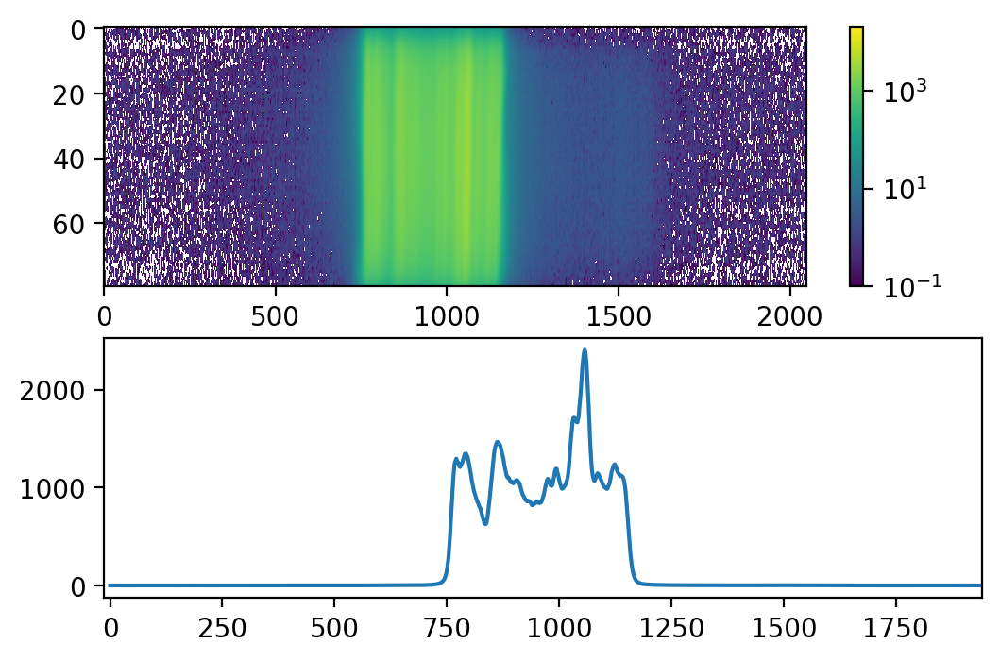

In [70]:
f,a=plt.subplots(2,1,dpi=200)

#Plot the average spectrum in log scale
av_spec_2D=np.average(dat,axis=(0,1))
cb=a[0].imshow(av_spec_2D,aspect='auto',norm=LogNorm(vmin=1e-1,vmax=2e4))
plt.colorbar(cb,ax=a[0])

#Vertically Bin to Obtain the Average ZLP
av_spec=np.average(dat,axis=(0,1,2))
a[1].plot(av_spec)
fwhm=Get_FWHM_i(av_spec)
a[1].set_xlim(fwhm[2]-3*fwhm[3],fwhm[2]+3*fwhm[3])
print('Energy Resolution = '+str(round(1000*fwhm[3]*disp,1))+' meV')


In [63]:
#One thing we could try is to integrate every pixel vertically then use standard EELS analysis

dat_sum=np.sum(dat,axis=2)

dat_sum.shape

(64, 64, 2048)

In [64]:
def GetSIEnergyAxes(dat,disp,style='fwhm',subpix_w=30):
    """
    Creates a numpy array of calibrated energy loss axes calibrated to individual spectra in SI
    
    Input:    dat      - data (numpy array)
              disp     - energy dispersion in eV (float)
              style    - 'pixel': calibrates to pixel with max intensity of ZLP
                         'fwhm': calibrates to center of fwhm of ZLP (Default)
                         'subpixel': fits gaussian to a number of pixels around the ZLP (w pixels)
    Optional: subpix_w - Number of pixels for sub-pixel ZLP fit (Default = 30)
    Output:   ens      - calibrated energy axes (numpy array)
    """   
    
    E_init=np.arange(0,dat.shape[-1])*disp
    w=int(subpix_w/2.)
    if style=='pixel':
        centers=np.array([[E_init[np.argmax(s)] for s in row] for row in dat])
    if style=='fwhm':
        centers=np.asarray([[np.average(Get_FWHM(E_init,s)[:2]) for s in row] for row in dat])
    if style=='subpixel':
        centers=np.array([[optimize.curve_fit(gauss,E_init[np.argmax(s)-w:np.argmax(s)+w],
                s[np.argmax(s)-w:np.argmax(s)+w]/np.amax(s))[0][1] for s in row] for row in dat])
    ens=np.array([[E_init-c for c in row] for row in centers])
    return ens

def GetCalibratedSI(dat,ens,en_lo=None,en_hi=None,n_int=None):
    """
    Creates new interpolated energy-loss axis to which all spectra in the SI are aligned
    
    Input:    dat   - data (numpy array)
              ens   - calibrated energy axes (numpy array)
    Optional: en_lo  - desired lowest energy of the output data (float)
                        Default: None (finds highest minimum energy available for all spectra)
              en_hi  - desired highest energy of cropped data (float)
                        Default: None (finds lowest maximum energy available for all spectra)
              n_int - Number of data points for interpolated axis (int)
                        Default: None (chooses number to be closest to as-acquired dispersion)
    Output:   E     - calibrated energy axis (numpy array)
              SI    - calibrated spectrum image (numpy array)
    """   
    
    m=np.amax(ens[:,:,0]);M=np.amin(ens[:,:,-1])  
    dispersion=ens[0,0,1]-ens[0,0,0]
    if not en_lo or en_lo<m: en_lo=m
    if not en_hi or en_hi>M: en_hi=M
    if not n_int: n_int=int((en_hi-en_lo)/dispersion)
    E=np.linspace(en_lo,en_hi,n_int)
    dim=ens.shape
    SI=np.zeros((*dim[:2],n_int))
    for i in range(dim[0]):
        for j in range(dim[1]):
            k1=Get_i(ens[i,j],en_lo);k2=Get_i(ens[i,j],en_hi)
            fSI=interpolate.interp1d(ens[i,j],dat[i,j],kind='linear')
            SI[i,j]=fSI(E)
    return E,SI

Energy Resolution = 7.1 meV


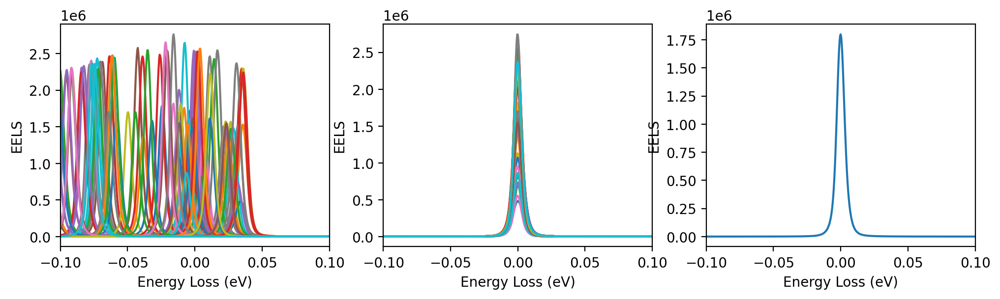

In [79]:
# Calibrate Spectrum Image ZLPs
ens_sum=GetSIEnergyAxes(dat_sum,disp)
E_sum,SI_sum=GetCalibratedSI(dat_sum,ens_sum)

#Generate Uncalibrated Energy Axis
E_rough=(np.arange(dat.shape[-1])-np.argmax(np.average(dat_sum,axis=(0,1))))*disp
f,a=plt.subplots(1,3,dpi=200,figsize=(12,3))
plt.setp(a,xlabel='Energy Loss (eV)',ylabel='EELS',xlim=(-0.1,0.1))
for N in range(100):
    i=np.random.randint(SI_sum.shape[0])
    j=np.random.randint(SI_sum.shape[1])
    a[0].plot(E_rough,dat_sum[i,j])
    a[1].plot(E_sum,SI_sum[i,j])
av_SI_sum=np.average(SI_sum,axis=(0,1))
a[2].plot(E_sum,av_SI_sum)

fwhm=Get_FWHM(E_sum,av_SI_sum)
print('Energy Resolution = '+str(round(1000*fwhm[2],1))+' meV')

In [66]:
#This is my function for 2D EELS alignment, it doesn't work all the time, if it fails strategies are to try to cutoff the lower intensity y-channels at the top

def AlignZLP_2DEELS_Seq_Simple(eels,disp,style='fwhm',subpix_w=30.,en_lo=None,en_hi=None,int_N=None,interp_fwhm=False):
    """
    Aligns the ZLP of a Sequence of 2D EELS (recordings or linescans) so that the ZLP max falls on the same x-channel for every y-pixel and every recording
    
    Input:    eels        - EELS data (numpy array)
              disp        - dispersion of acquisition in eV (float)
    Optional: style       - 'pixel': calibrates to pixel with max intensity of ZLP
                            'fwhm': calibrates to center of fwhm of ZLP (Default)
                            'subpixel': fits gaussian to a number of pixels around the ZLP (int, subpix_w pixels)
              subpix_w    - Number of pixels for sub-pixel ZLP fit (Default = 30)
              e_lo        - desired lowest energy of the output data (float)
                              Default: None (finds highest minimum energy available for all recordings and y-channels)
              e_hi        - desired highest energy of cropped data (float)
                              Default: None (finds lowest maximum energy available for all recordings and y-channels)
              int_N       - # of interpolation points (int)
                              Default: None (chooses based off of number of pixels between e_hi and e_lo at native dispersion)
              interp_fwhm - Find interpolated FWHM instead of pixel FWHM (bool) (Default=False)
    Output:   en_interp   - aligned energy axis for entire dataset (numpy array)
              eels_interp - aligned and interpolated data in both axes (numpy array) 
    """        
    
    dim=eels.shape
    m=-dim[2]*disp;M=dim[2]*disp
    total=np.prod(dim[:2])
    interpolations=[]
    failed=0
    w=int(subpix_w/2.)
    print("Interpolating from Recording")
    for i in range(dim[0]):
        interpolations.append([])
        eels_im=eels[i]
        for j in range(dim[1]):
            en_init=np.arange(dim[2])*disp
            if style=='pixel': c=en_init[np.argmax(eels_im[j])]
            if style=='fwhm':  c=np.average(Get_FWHM(en_init,eels_im[j],interp=interp_fwhm)[:2])
            if style=='subpixel': 
                def gauss(x,a,x0,s):
                    return a*np.exp(-(x-x0)**2/s**2)
                kmax=np.argmax(eels_im[j])
                bounds=((0,en_init[kmax-5],0),(np.inf,en_init[kmax+5],np.inf))
                try: c=optimize.curve_fit(gauss,en_init[kmax-w:kmax+w],NormArray(eels_im[j,kmax-w:kmax+w]),bounds=bounds)[0][1]
                except RuntimeError: 
                    print(' Failed on eels_im '+str(i)+' y_channel '+str(j))
                    failed+=1
                    c=en_init[np.argmax(kmax)]
            en=en_init-c
            if en[0]>m: m=en[0]
            if en[-1]<M: M=en[-1]
            interpolations[-1].append(interpolate.interp1d(en,eels[i,j],kind='linear'))
            WritePercentage(i*dim[1]+j+1,total)
    if style=='subpixel': print('\nFailed on '+str(failed)+' subpixel fits')
    if not en_lo or en_lo<m: en_lo=m
    if not en_hi or en_hi>M: en_hi=M
    if not int_N: int_N=int((en_hi-en_lo)/disp)
    en_interp=np.linspace(en_lo,en_hi,int_N)
    eels_interp=np.zeros(dim[:2]+(int_N,))
    print("\nGenerating Data from Interpolations")
    for i in range(dim[0]):
        for j in range(dim[1]):
            eels_interp[i,j]=interpolations[i][j](en_interp)
            WritePercentage(i*dim[1]+j+1,total)
    eels_interp=np.asarray([[y_chan(en_interp) for y_chan in eels_im] for eels_im in interpolations])
    return en_interp,eels_interp

def WritePercentage(i,total):
    """
    Writes out percent of total based off of index
    
    Input:  i     - index in for loop (int)
            total - total indeces to run (int)
    Output: Doesn't output anything, some magic I don;t understand happens that causes it to overwrite the previous %
    """    
    import sys
    if (i%(total/100.))<1:
        sys.stdout.write('\r')   
        sys.stdout.write("%d%%" % int(100*(i/total)))
        sys.stdout.flush()
    return

In [93]:
# Reshape so that all spatial pixels are in one axis 
datalign=dat.reshape((-1,*dat.shape[-2:]))

E,SI_2D_flat=AlignZLP_2DEELS_Seq_Simple(datalign,disp)

#Convert flat data to shaped, integrated SI
SI_2D=SI_2D_flat.reshape((*dat.shape[:3],E.shape[0]))
SI=np.sum(SI_2D,axis=2)

Energy Resolution = 6.4 meV


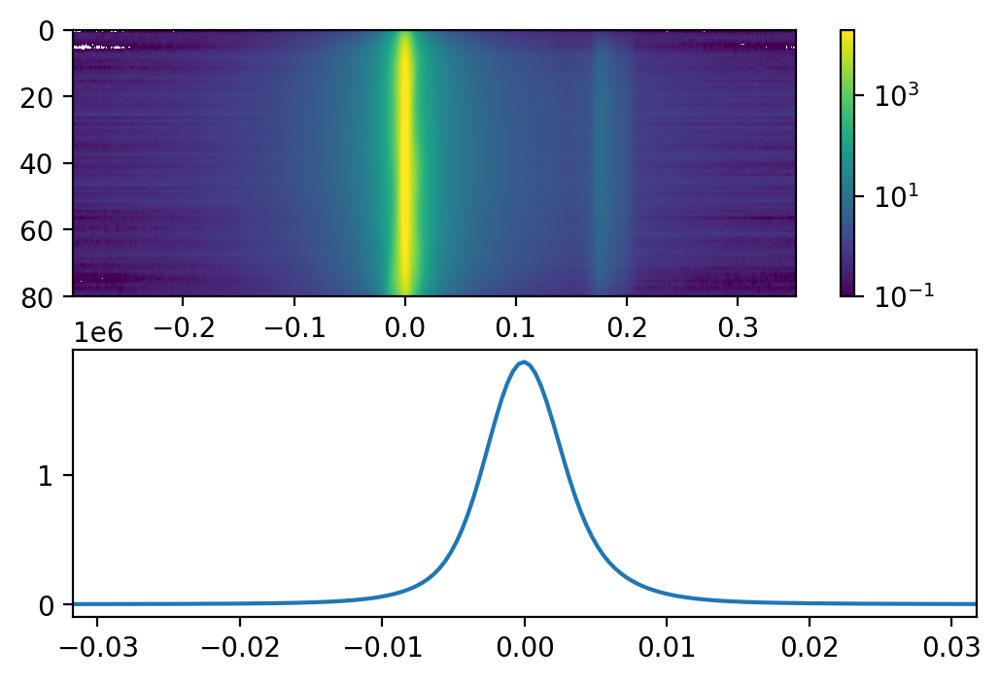

In [94]:
f,a=plt.subplots(2,1,dpi=200)

#Plot the average spectrum in log scale
av_SI_2D=np.average(SI_2D,axis=(0,1))
SI_2D_extent=[E[0],E[-1],SI_2D.shape[2],0]
cb=a[0].imshow(av_SI_2D,aspect='auto',norm=LogNorm(vmin=.1,vmax=20000),extent=SI_2D_extent)
plt.colorbar(cb,ax=a[0])

#Vertically Bin to Obtain the Average ZLP
av_SI=np.average(SI,axis=(0,1))
a[1].plot(E,av_SI)
fwhm=Get_FWHM(E,av_SI)
a[1].set_xlim(-5*fwhm[2],5*fwhm[2])
print('Energy Resolution = '+str(round(1000*fwhm[2],1))+' meV')

(0.0, 520.0)

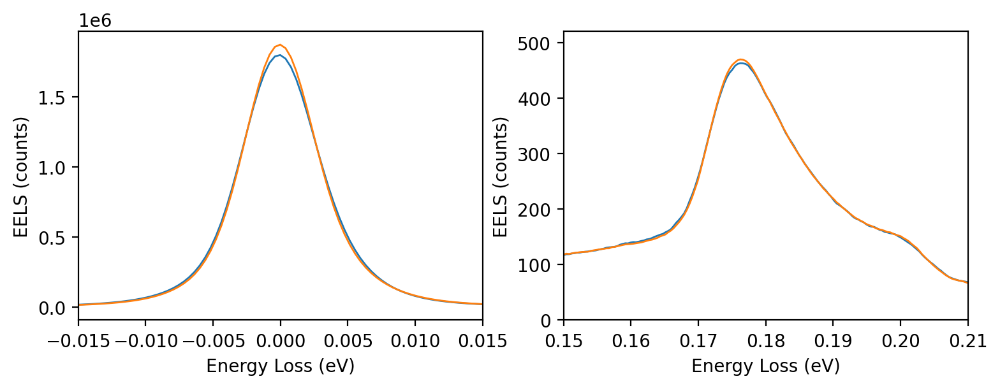

In [114]:
f,a=plt.subplots(1,2,figsize=(9,3),dpi=200)
plt.setp(a,xlabel='Energy Loss (eV)',ylabel='EELS (counts)')
a[0].plot(E_sum,av_SI_sum,lw=1)
a[0].plot(E,av_SI,lw=1)
a[0].set_xlim(-0.015,0.015)

a[1].plot(E_sum,av_SI_sum,lw=1)
a[1].plot(E,av_SI,lw=1)
a[1].set_xlim(0.15,0.21)
a[1].set_ylim(0,520)

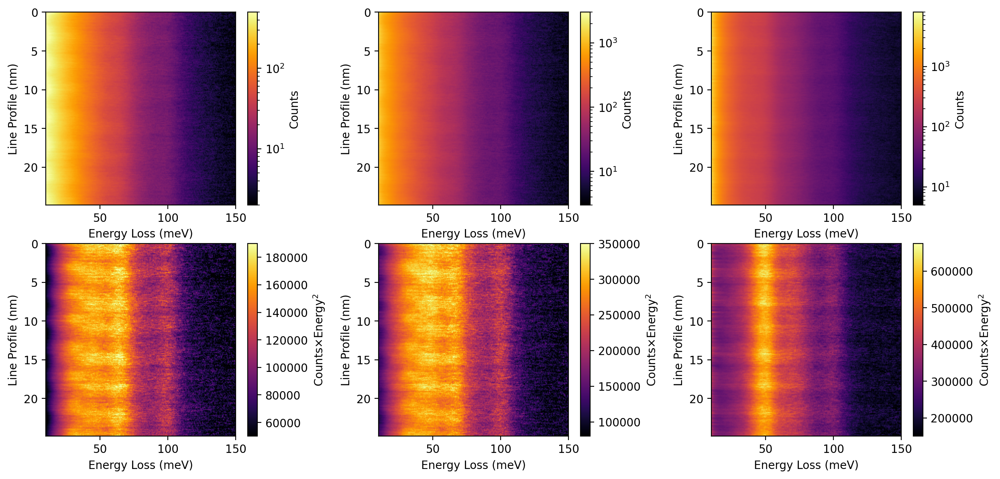

In [47]:
LST=np.average(LS_2D[:,:Top_i],axis=1)
LSM=np.average(LS_2D[:,Top_i:Middle_i],axis=1)
LSB=np.average(LS_2D[:,Middle_i:],axis=1)

LST_E2=np.asarray([[val*(En*1000)**2 for val,En in zip(S,E)] for S in LST])
LSM_E2=np.asarray([[val*(En*1000)**2 for val,En in zip(S,E)] for S in LSM])
LSB_E2=np.asarray([[val*(En*1000)**2 for val,En in zip(S,E)] for S in LSB])

D=np.arange(LST.shape[0])*cal
LS_extent=[E[0]*1000,E[-1]*1000,D[-1],D[0]]
f,a=plt.subplots(2,3,dpi=200,figsize=(15,7))
plt.subplots_adjust(wspace=0.4,left=0.15,right=0.9)
plt.setp(a,xlim=(10,150),xlabel='Energy Loss (meV)',ylabel='Line Profile (nm)')

im=a[0,0].imshow(LST,extent=LS_extent,aspect='auto',cmap=cm.inferno,norm=LogNorm(2e0,5e2))
plt.colorbar(im,ax=a[0,0],label='Counts')
im=a[0,1].imshow(LSM,extent=LS_extent,aspect='auto',cmap=cm.inferno,norm=LogNorm(3e0,3e3))
plt.colorbar(im,ax=a[0,1],label='Counts')
im=a[0,2].imshow(LSB,extent=LS_extent,aspect='auto',cmap=cm.inferno,norm=LogNorm(5e0,8e3))
plt.colorbar(im,ax=a[0,2],label='Counts')

im=a[1,0].imshow(LST_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=5e4,vmax=1.9e5)
plt.colorbar(im,ax=a[1,0],label=r'Counts$\times$Energy$^2$')
im=a[1,1].imshow(LSM_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=8e4,vmax=3.5e5)
plt.colorbar(im,ax=a[1,1],label=r'Counts$\times$Energy$^2$')
im=a[1,2].imshow(LSB_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=1.5e5,vmax=6.75e5)
plt.colorbar(im,ax=a[1,2],label=r'Counts$\times$Energy$^2$')

Note that the spectrum we get in LS_T is fundamentally different than the spec we get in LS_B because the ratio of dipole to impact scattering is different. Clearly there is an IR peak at 50 meV that is dipole active and the ones we observe in LS_T are all non-dipole active excitations. This is why I like to leave a little bit of the BF disk in the bottom, to find out what's different between on- and off-axis (It will matter less for your band-edge measurements).

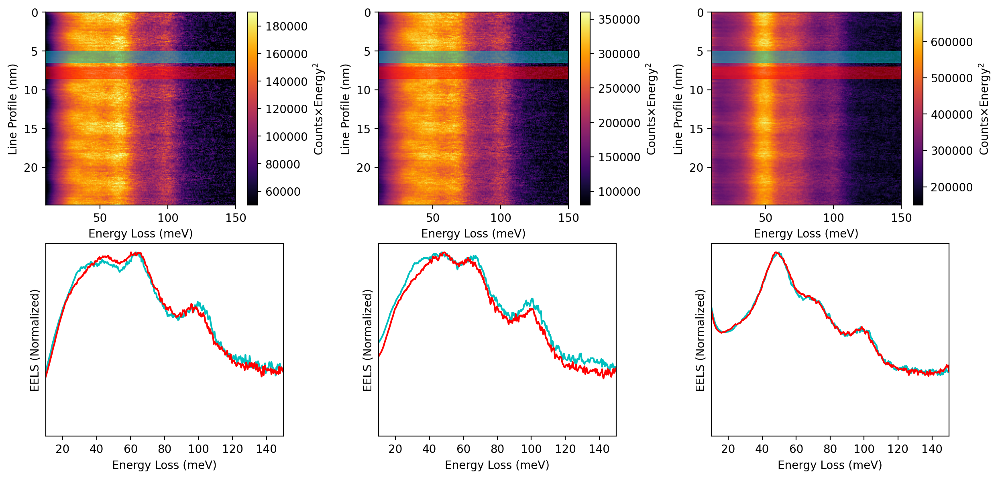

In [57]:
CTO_T=5;CTO_B=6.5
STO_T=7;STO_B=8.5

f,a=plt.subplots(2,3,dpi=200,figsize=(15,7))
plt.subplots_adjust(wspace=0.4,left=0.15,right=0.9)
plt.setp(a[0],xlim=(10,150),xlabel='Energy Loss (meV)',ylabel='Line Profile (nm)')
im=a[0,0].imshow(LST_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=5e4,vmax=1.9e5)
plt.colorbar(im,ax=a[0,0],label=r'Counts$\times$Energy$^2$')
a[0,0].fill_between([10,150],CTO_T,CTO_B,color='c',alpha=0.5,lw=0.5)
a[0,0].fill_between([10,150],STO_T,STO_B,color='r',alpha=0.5,lw=0.5)
im=a[0,1].imshow(LSM_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=8e4,vmax=3.6e5)
plt.colorbar(im,ax=a[0,1],label=r'Counts$\times$Energy$^2$')
a[0,1].fill_between([10,150],CTO_T,CTO_B,color='c',alpha=0.5,lw=0.5)
a[0,1].fill_between([10,150],STO_T,STO_B,color='r',alpha=0.5,lw=0.5)
im=a[0,2].imshow(LSB_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=1.5e5,vmax=6.8e5)
plt.colorbar(im,ax=a[0,2],label=r'Counts$\times$Energy$^2$')
a[0,2].fill_between([10,150],CTO_T,CTO_B,color='c',alpha=0.5,lw=0.5)
a[0,2].fill_between([10,150],STO_T,STO_B,color='r',alpha=0.5,lw=0.5)

S_CTO_T=np.average(LST_E2[Get_i(D,CTO_T):Get_i(D,CTO_B)],axis=0)
S_STO_T=np.average(LST_E2[Get_i(D,STO_T):Get_i(D,STO_B)],axis=0)
S_CTO_M=np.average(LSM_E2[Get_i(D,CTO_T):Get_i(D,CTO_B)],axis=0)
S_STO_M=np.average(LSM_E2[Get_i(D,STO_T):Get_i(D,STO_B)],axis=0)
S_CTO_B=np.average(LSB_E2[Get_i(D,CTO_T):Get_i(D,CTO_B)],axis=0)
S_STO_B=np.average(LSB_E2[Get_i(D,STO_T):Get_i(D,STO_B)],axis=0)

plt.setp(a[1],xlim=(10,150),xlabel='Energy Loss (meV)',ylabel='EELS (Normalized)',yticks=[])
a[1,0].plot(E*1000,NormArray(S_CTO_T),color='c')
a[1,0].plot(E*1000,NormArray(S_STO_T),color='r')
a[1,1].plot(E*1000,NormArray(S_CTO_M),color='c')
a[1,1].plot(E*1000,NormArray(S_STO_M),color='r')
a[1,2].plot(E*1000,NormArray(S_CTO_B),color='c')
a[1,2].plot(E*1000,NormArray(S_STO_B),color='r')

Text(0, 0.5, 'Spectrometer Channel')

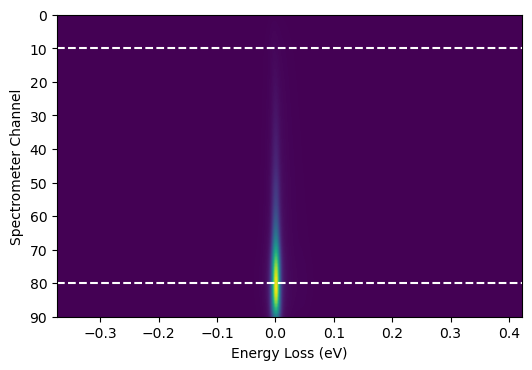

In [58]:
Top_i=10;Middle_i=80
plt.figure(dpi=100)
plt.imshow(av_LS_2D,aspect='auto',extent=LS_2D_extent)
plt.axhline(Top_i,color='w',ls='--')
plt.axhline(Middle_i,color='w',ls='--')
plt.xlabel('Energy Loss (eV)')
plt.ylabel('Spectrometer Channel')

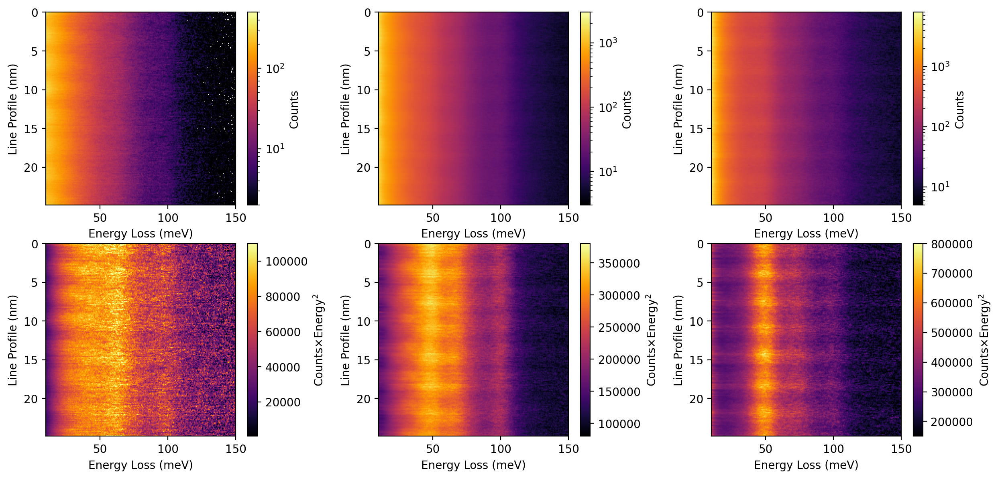

In [68]:
LST=np.average(LS_2D[:,:Top_i],axis=1)
LSM=np.average(LS_2D[:,Top_i:Middle_i],axis=1)
LSB=np.average(LS_2D[:,Middle_i:],axis=1)

LST_E2=np.asarray([[val*(En*1000)**2 for val,En in zip(S,E)] for S in LST])
LSM_E2=np.asarray([[val*(En*1000)**2 for val,En in zip(S,E)] for S in LSM])
LSB_E2=np.asarray([[val*(En*1000)**2 for val,En in zip(S,E)] for S in LSB])

D=np.arange(LST.shape[0])*cal
LS_extent=[E[0]*1000,E[-1]*1000,D[-1],D[0]]
f,a=plt.subplots(2,3,dpi=200,figsize=(15,7))
plt.subplots_adjust(wspace=0.4,left=0.15,right=0.9)
plt.setp(a,xlim=(10,150),xlabel='Energy Loss (meV)',ylabel='Line Profile (nm)')

im=a[0,0].imshow(LST,extent=LS_extent,aspect='auto',cmap=cm.inferno,norm=LogNorm(2e0,5e2))
plt.colorbar(im,ax=a[0,0],label='Counts')
im=a[0,1].imshow(LSM,extent=LS_extent,aspect='auto',cmap=cm.inferno,norm=LogNorm(3e0,3e3))
plt.colorbar(im,ax=a[0,1],label='Counts')
im=a[0,2].imshow(LSB,extent=LS_extent,aspect='auto',cmap=cm.inferno,norm=LogNorm(5e0,8e3))
plt.colorbar(im,ax=a[0,2],label='Counts')

im=a[1,0].imshow(LST_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=5e2,vmax=1.1e5)
plt.colorbar(im,ax=a[1,0],label=r'Counts$\times$Energy$^2$')
im=a[1,1].imshow(LSM_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=8e4,vmax=3.8e5)
plt.colorbar(im,ax=a[1,1],label=r'Counts$\times$Energy$^2$')
im=a[1,2].imshow(LSB_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=1.5e5,vmax=8e5)
plt.colorbar(im,ax=a[1,2],label=r'Counts$\times$Energy$^2$')

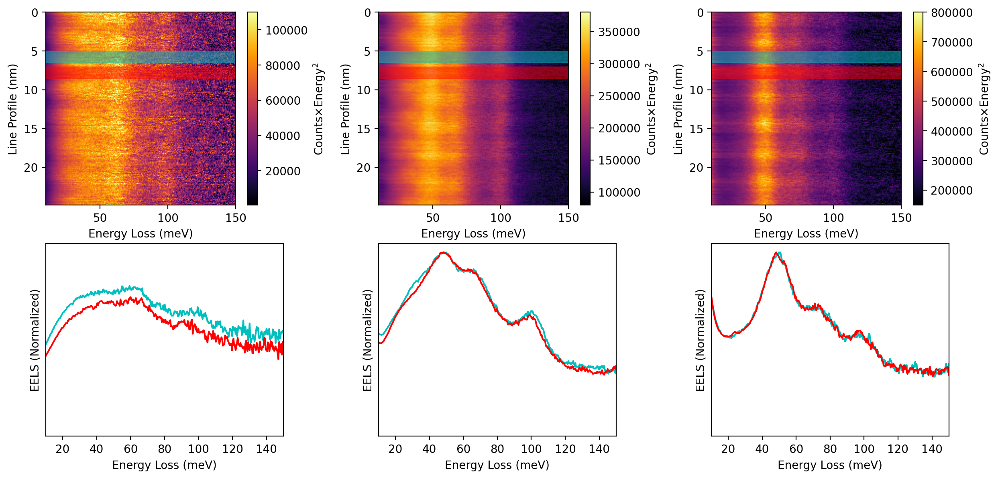

In [69]:
CTO_T=5;CTO_B=6.5
STO_T=7;STO_B=8.5

f,a=plt.subplots(2,3,dpi=200,figsize=(15,7))
plt.subplots_adjust(wspace=0.4,left=0.15,right=0.9)
plt.setp(a[0],xlim=(10,150),xlabel='Energy Loss (meV)',ylabel='Line Profile (nm)')
im=a[0,0].imshow(LST_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=5e2,vmax=1.1e5)
plt.colorbar(im,ax=a[0,0],label=r'Counts$\times$Energy$^2$')
a[0,0].fill_between([10,150],CTO_T,CTO_B,color='c',alpha=0.5,lw=0.5)
a[0,0].fill_between([10,150],STO_T,STO_B,color='r',alpha=0.5,lw=0.5)
im=a[0,1].imshow(LSM_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=8e4,vmax=3.8e5)
plt.colorbar(im,ax=a[0,1],label=r'Counts$\times$Energy$^2$')
a[0,1].fill_between([10,150],CTO_T,CTO_B,color='c',alpha=0.5,lw=0.5)
a[0,1].fill_between([10,150],STO_T,STO_B,color='r',alpha=0.5,lw=0.5)
im=a[0,2].imshow(LSB_E2,extent=LS_extent,aspect='auto',cmap=cm.inferno,vmin=1.5e5,vmax=8e5)
plt.colorbar(im,ax=a[0,2],label=r'Counts$\times$Energy$^2$')
a[0,2].fill_between([10,150],CTO_T,CTO_B,color='c',alpha=0.5,lw=0.5)
a[0,2].fill_between([10,150],STO_T,STO_B,color='r',alpha=0.5,lw=0.5)

S_CTO_T=np.average(LST_E2[Get_i(D,CTO_T):Get_i(D,CTO_B)],axis=0)
S_STO_T=np.average(LST_E2[Get_i(D,STO_T):Get_i(D,STO_B)],axis=0)
S_CTO_M=np.average(LSM_E2[Get_i(D,CTO_T):Get_i(D,CTO_B)],axis=0)
S_STO_M=np.average(LSM_E2[Get_i(D,STO_T):Get_i(D,STO_B)],axis=0)
S_CTO_B=np.average(LSB_E2[Get_i(D,CTO_T):Get_i(D,CTO_B)],axis=0)
S_STO_B=np.average(LSB_E2[Get_i(D,STO_T):Get_i(D,STO_B)],axis=0)

plt.setp(a[1],xlim=(10,150),xlabel='Energy Loss (meV)',ylabel='EELS (Normalized)',yticks=[])
a[1,0].plot(E*1000,NormArray(S_CTO_T),color='c')
a[1,0].plot(E*1000,NormArray(S_STO_T),color='r')
a[1,1].plot(E*1000,NormArray(S_CTO_M),color='c')
a[1,1].plot(E*1000,NormArray(S_STO_M),color='r')
a[1,2].plot(E*1000,NormArray(S_CTO_B),color='c')
a[1,2].plot(E*1000,NormArray(S_STO_B),color='r')